# **Case Study #1 - Lending Club Dataset**

## Created by: <u>Srikrishnan Veeraraghavan</u>

<br> <br>
## <u>_Describe the dataset and any issues with it._</u>

<br>

* The given dataset is a set of approved loans made through the lending club platform.

* The dataset contains 10,000 loans that were issued during the months of January, February and March of 2018.

* It contains a wide variety of attributes pertaining to the loan applicant's financial status and credit history as well as details of the particular loan that was approved.

* The dataset is a snapshot at a particular point of time which is unknown.





#### **_Variables in Dataset_**

The dataset can be broadly divided into 6 different categories of variables:
1. **Demographic Data** - Contains data pertaining to the nature of employment of the borrower, the state of the borrower and the type of home ownership (rented/owned/mortaged).

2. **Financial Wellbeing** - Contains data related to the income of the borrower and the debt to income ratio, which are indicators of the borrower's financial ability to repay a loan, if taken.

3. **Credit History (Delinquency)** - Data points pertaining to the borrower's repayment history, specifically signs of failure to repay. Covers the number of delinquencies, severity of the delinquencies and the time since last delinquency.

4. **Credit History (Tradelines)** - Broadly covers number, nature and credit amount of tradelines taken by the borrower and inquiries (indicating credit hungriness of the borrower).

5. **Loan Specifications** - Details on the particular loan that was approved (Loan Amount, Tenure, Interest Rate etc.)

6. **Loan Status** - Pertains to the particular snapshot of data. At the given point of time, what is the outstanding balance and amounts paid by the borrower till then.

Here's a list of all variables classified under each category:

![dataset categories](lending_club_dataset.png "Types of Variables in Loans Dataset")

### **_Issues with the Dataset_**

1. The dataset contains data points pertaining to a very small period (Jan'18 - Mar'18). The consequence of this is an inability to perform Out Of Time validations on any predictions that are made. Since the data present covers a very small window, it might be possible that any model trained on this data might not generalize well to other time periods as the nature of the financial ecosystem might vary with time.

2. The snapshot time of the dataset is unclear. There are variables like balance and paid total, which seem to be populated at an unknown point of time after the loan is approved. There are also variables like accounts_opened_24m or months_since_last_credit_inquiry which are more likely captured at the point of loan approval, but could also be data pertaining to the point of time of the snapshot. (For all future analysis we will assume that this kind of data was captured right before the application was approved).

3. The dataset contains a mix of numeric and categorical data. Categorical variables need to be encoded in order for most predictive models to be able to process them.

4. The numeric data is not standardized. For many machine learning algorithms that use vector distances (Eg. Gradient Descent, KNN) and some EDA algorithms (Eg. PCA) data needs to be standardized for optimal functioning.

5. Missing Values - While the dataset is fairly dense for the most part, missing values in variables like emp_length, num_accounts_120d_past_due need to be treated before they are used.

6. There is a lack of clarity on how certain variables are calculated. For instance, the debt_to_income ratio seems alarmingly high for most of the customers!

## _<u>Generate a minimum of 5 unique visualizations using the data and write a brief description of your observations. Additionally, all attempts should be made to make the visualizations visually appealing.</u>_
<br><br>

In [1]:
#Import Plotly for visualizations

import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly
plotly.offline.init_notebook_mode(connected=True)

In [2]:
import pandas as pd
import numpy as np

#Read dataset
loans_df = pd.read_csv('loans_full_schema.csv')

<br>

## 1. Quality of Loans

To better understand the quality of the loan portfolio, we can look at the number of loans across each grade and the risk associated with each loan. To evaluate the risk, we define a metric ever_delq_2y as ever delinquent in the last 2 years i.e. if a customer has been delinquent at least once in the last 2 years.

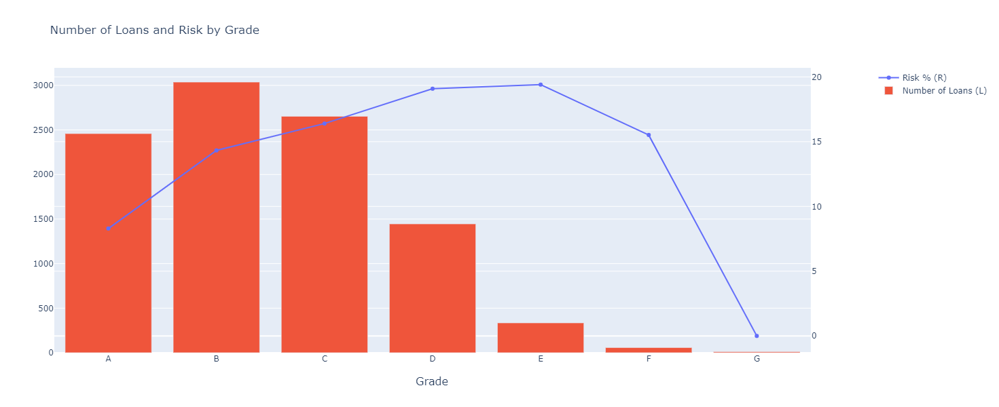

In [3]:
loans_df = loans_df.assign(ever_delq_2y = np.where(loans_df['delinq_2y'] > 0, 1, 0))
loans_df['ever_delq_2y'] = loans_df['ever_delq_2y']*100

grade_risk = loans_df.groupby(['grade']).agg({'ever_delq_2y':'mean'}).reset_index()

grade_count = loans_df.groupby(['grade']).agg({'ever_delq_2y':'count'}).reset_index()


fig = make_subplots(specs=[[{"secondary_y": True}]],x_title='Grade')

fig.add_trace(go.Scatter(x=grade_risk.grade,y=grade_risk.ever_delq_2y,name="Risk % (R)"),secondary_y=True)
    
fig.add_trace(go.Bar(x=grade_count.grade,y=grade_count.ever_delq_2y,name="Number of Loans (L)"),secondary_y=False)

fig.update_layout(height=600, width=1000, title_text="Number of Loans and Risk by Grade")

#### We can see that the quality of loans is good with most of them falling under the B and C grades. These, as expected, are associated with a lower risk (14-16%) as compared to grades D and E (~19%).

<br> <br>

## 2. Risk of Digital Customers

It is hypothesized that customers who prefer digital channels for transactions are less risky than customers who opt for cash.

Here we compare the risk of borrowers who go for cash disbursement vs DirectPay.

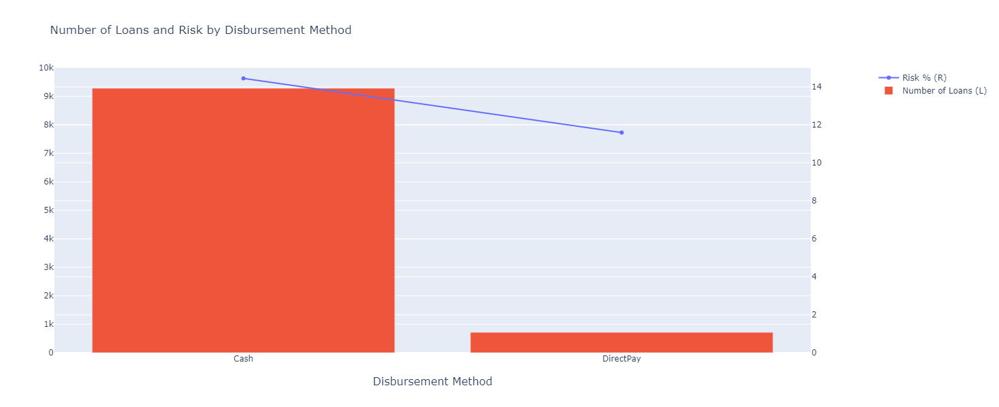

In [4]:
loans_df = loans_df.assign(ever_delq_2y = np.where(loans_df['delinq_2y'] > 0, 1, 0))
loans_df['ever_delq_2y'] = loans_df['ever_delq_2y']*100

disb_risk = loans_df.groupby(['disbursement_method']).agg({'ever_delq_2y':'mean'}).reset_index()

disb_count = loans_df.groupby(['disbursement_method']).agg({'ever_delq_2y':'count'}).reset_index()

fig = make_subplots(specs=[[{"secondary_y": True}]],x_title='Disbursement Method')

fig.add_trace(go.Scatter(x=disb_risk.disbursement_method,y=disb_risk.ever_delq_2y,name="Risk % (R)"),secondary_y=True)

fig.add_trace(go.Bar(x=disb_count.disbursement_method,y=disb_count.ever_delq_2y,name="Number of Loans (L)"),secondary_y=False)

fig.update_layout(height=600, width=1000, title_text="Number of Loans and Risk by Disbursement Method")
fig.update_yaxes(range=[0, 15],secondary_y=True)
fig.update_yaxes(range=[0, 10000],secondary_y=False)

#### We can see that while the number of borrowers for which DirectPay is the preffered method of disbursement is much lower, there is a significant difference in the percentage of borrowers who have been delinquent as compared to Cash.

<br><br>

## 3. Annual Income by State

The income of a borrower is one of the primary factors in gauging the ability of a borrower to repay their loan. Targeting states with a higher median income would be a preferable sales strategy for lenders to procure credit-worthy customers.

While one could use census data for the same information, Lending Club data would filter out population with a higher credit score, and the trends in income might be different than a more generalized estimate.

Below, we look at a visualization of state-wise median income.

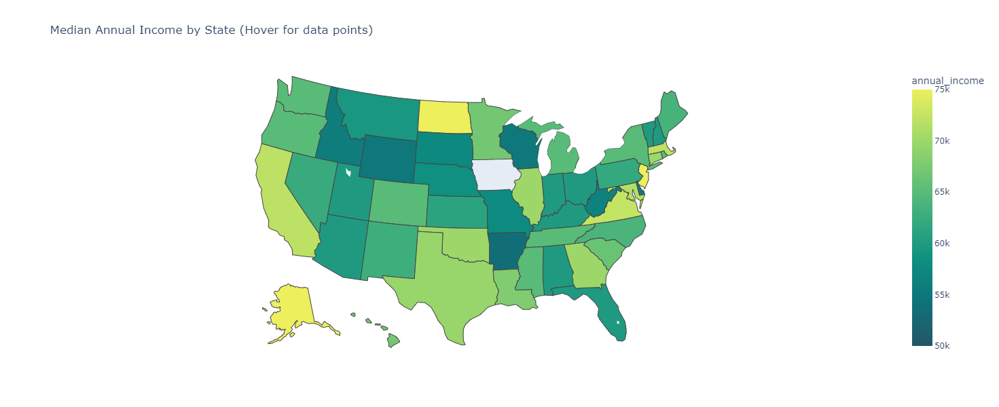

In [5]:
geo_income = loans_df.groupby('state').agg({'annual_income': 'median'}).reset_index().round(-2)

px.choropleth(geo_income, 
              locations = 'state',
              color="annual_income",
              color_continuous_scale="Aggrnyl",
              locationmode='USA-states',
              scope="usa",
              range_color=(50000, 75000),
              title='Median Annual Income by State (Hover for data points)',
              height=600
             )

#### North Dakota, Alaska and New Jersey are among the states that have the highest median income. New Jersey in particular might be a rewarding prospect for procuring new borrowers as it has a fairly high population.

<br> <br>

## 4. Loan Amount and Interest Rates Box Plots

Box plots are a quick way of representing the distributions of variables and comparing distributions across different categories.

Here we can quickly analyse how the disbursed loan amounts and interest rates vary for different purposes of loans.

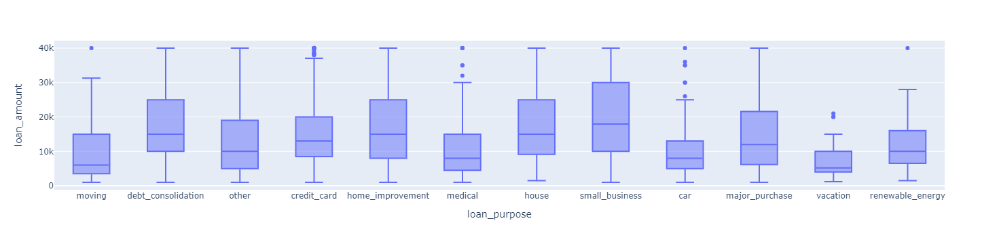

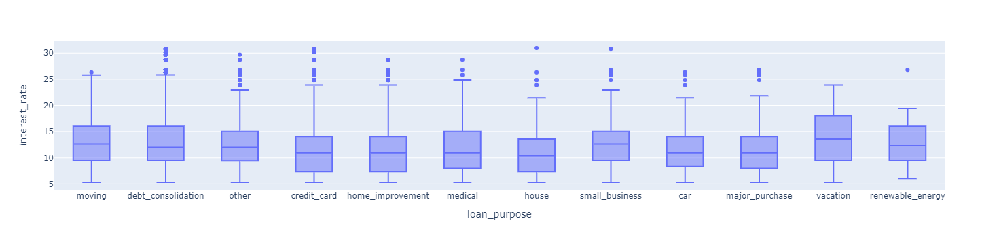

In [6]:
fig = px.box(loans_df, x="loan_purpose", y="loan_amount")
fig.show()

fig2 = px.box(loans_df, x="loan_purpose", y="interest_rate")
fig2.show()

#### We can see that that the median is highest for small business loans, which is expected as businesses require larger amounts of capital investment upfront. The median interest rates for vacations are the highest which is a great market as disposable income increases over the years. It is also interesting to note how people take large amounts of loan to pay off their credit cards(upto 37k and more). This might be beneficial as the average interest rate in the market is around 14.5% whereas the median interest rate for the loan is only around 10.9%.

<br> <br>

## 5. Distribution of time since last inquiry

Here we look at the distribution of number of months since the last credit inquiry.

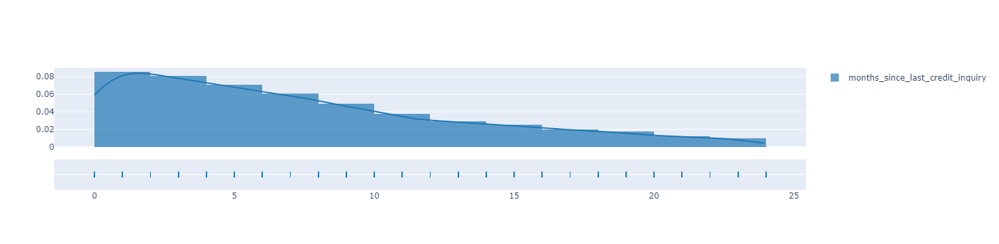

In [7]:
fig = ff.create_distplot([loans_df[loans_df.months_since_last_credit_inquiry.notna()].months_since_last_credit_inquiry],group_labels=['months_since_last_credit_inquiry'], bin_size=2)
fig.show()

#### We can see that this variable is right skewed and most borrowers have made inquiries recently in the past few months. This is likely due to two reasons: The data points have been updated post approval of loan (or) this variable includes soft inquiries which many customers might have made to gauge the best interest rates. 

<br> <br> <br>

## _<u>Create a feature set and create a model which predicts interest rate using at least 2 algorithms. Describe any data cleansing that must be performed and analysis when examining the data.</u>_

##### Note: Assumptions described as and when they are made.


### **_Data Cleaning_**


##### First we will look at missing values in the data set.

In [8]:
loans_df = pd.read_csv('loans_full_schema.csv')

loans_df.count()

emp_title                            9167
emp_length                           9183
state                               10000
homeownership                       10000
annual_income                       10000
verified_income                     10000
debt_to_income                       9976
annual_income_joint                  1495
verification_income_joint            1455
debt_to_income_joint                 1495
delinq_2y                           10000
months_since_last_delinq             4342
earliest_credit_line                10000
inquiries_last_12m                  10000
total_credit_lines                  10000
open_credit_lines                   10000
total_credit_limit                  10000
total_credit_utilized               10000
num_collections_last_12m            10000
num_historical_failed_to_pay        10000
months_since_90d_late                2285
current_accounts_delinq             10000
total_collection_amount_ever        10000
current_installment_accounts      

<br><br>

##### For *emp_title* we will populate the missing values as 'other'.

##### For *emp_length* we will populate missing values as 0 since we do not know the *emp_title* and cannot generalize.


In [9]:
loans_df['emp_title'] = np.where(loans_df['emp_title'].isnull(),'other',loans_df['emp_title'])
loans_df['emp_length'] = np.where(loans_df['emp_length'].isnull(),0,loans_df['emp_length'])

<br><br><br>

In [10]:
loans_df[loans_df['debt_to_income'].isnull()][['annual_income','debt_to_income','annual_income_joint','debt_to_income_joint']]

,annual_income,debt_to_income,annual_income_joint,debt_to_income_joint
154,0.0,NaN,167250.0,14.92
927,0.0,NaN,28000.0,5.61
1255,0.0,NaN,150000.0,13.81
1330,0.0,NaN,84000.0,17.43
1653,0.0,NaN,74000.0,30.63
1718,0.0,NaN,128000.0,25.95
1845,0.0,NaN,134000.0,20.52
2106,1.0,NaN,74001.0,20.33
2546,0.0,NaN,88265.0,11.91
2556,0.0,NaN,77000.0,13.73


##### We can see that missing cases of *debt_to_income_ratio* arise due to *annual_income* being 0, but *debt_to_income_joint* is populated for all of them. We can assign this value to the missing variable since the loan approval would have been done based on both applicants.

In [11]:
loans_df['debt_to_income'] = np.where(loans_df['debt_to_income'].isnull(),loans_df['debt_to_income_joint'],loans_df['debt_to_income'])

<br><br><br>
##### Variables *months_since_last_delinq* and *months_since_90d_late* have missing values due to no history of delinquency. We will assign 999 to these missing values.

In [12]:
loans_df['months_since_last_delinq'] = np.where(loans_df['months_since_last_delinq'].isnull(),999,loans_df['months_since_last_delinq'])
loans_df['months_since_90d_late'] = np.where(loans_df['months_since_90d_late'].isnull(),999,loans_df['months_since_90d_late'])

<br><br><br>

In [13]:
loans_df[loans_df['num_accounts_120d_past_due'].isnull()][['num_accounts_120d_past_due','num_accounts_30d_past_due']].groupby('num_accounts_30d_past_due').size()

num_accounts_30d_past_due
0    317
1      1
dtype: int64

##### We can see that for the variable *num_accounts_120d_past_due* almost all customers have not gone past 30 days due. So we will assign these null values as 0

In [14]:
loans_df['num_accounts_120d_past_due'] = np.where(loans_df['num_accounts_120d_past_due'].isnull(),0,loans_df['num_accounts_120d_past_due'])

<br><br><br>

##### For *months_since_last_credit_inquiry*, the nulls are populated when there have been no inquiries. We will assign these null with a high value, say 999.

In [15]:
loans_df['months_since_last_credit_inquiry'] = np.where(loans_df['months_since_last_credit_inquiry'].isnull(),999,loans_df['months_since_last_credit_inquiry'])

<br><br><br><br>

##### -> On further investigation of the dataset, there are some columns that intuitively do not make sense for making predictions.

##### -> The variables *term, loan_status, issue_month, grade, sub_grade, initial_listing_status, disbursement_method, balance, paid_total, paid_principal, paid_interest, paid_late_fees* only exist after the loan is approved.

##### -> The variable *installment* is directly correlated with the interest rate, which is the target variable.

##### -> For starters, we will treat verified and unverified income equally and deep dive into it if there is a high positive correlation with the target.

##### We can drop all these variables from the dataset.

In [16]:
loans_df = loans_df.drop(['verified_income',
'verification_income_joint',
'term',
'installment',
'grade',
'sub_grade',
'issue_month',
'loan_status',
'initial_listing_status',
'disbursement_method',
'balance',
'paid_total',
'paid_principal',
'paid_interest',
'paid_late_fees'],axis=1)

<br><br><br>


##### In order to evaluate joint applications and individual applications together, we can create a combined variable *annual_income_max = max(annual_income, annual_income_joint)*.

##### Using the variables *annual_income_max* and *annual_income*, we can evaluate both individual capability and the joint capability of the applicants.

##### Similarly we can create *debt_to_income_min = min(debt_to_income, debt_to_income_joint)* which will capture the best performance of the joint applicants.

In [17]:
loans_df['annual_income_max'] =  loans_df[['annual_income', 'annual_income_joint']].max(axis=1)

loans_df['debt_to_income_min'] =  loans_df[['debt_to_income', 'debt_to_income_joint']].min(axis=1)

loans_df = loans_df.drop(['annual_income_joint','debt_to_income_joint'],axis=1)

<br><br><br>

##### The variable *total_credit_utilized* does not make sense by itself, it needs to be a ratio of *total_credit_utilized/total_credit_limit* to capture the extent to which one is utilizing their credit limit.

In [18]:
loans_df['utilization_ratio'] = np.where(loans_df['total_credit_limit']==0,0,loans_df['total_credit_utilized']/loans_df['total_credit_limit'])

loans_df = loans_df.drop(['total_credit_utilized'],axis=1)

<br><br><br>

##### The variable *earliest_credit_line* contains year values, which would be better viewed as vintage. Since all applications are in 2018, we can subtract the value of the variable from 2018.

In [19]:
loans_df['vintage_earliest_credit_line'] = 2018-loans_df['earliest_credit_line']

loans_df = loans_df.drop(['earliest_credit_line'],axis=1)

<br><br><br>

##### Now, we will need to encode the categorical variables for them to be mathematically usable.

##### Since variables like *emp_title* and *state* have too many values, naive methods like one hot encoding will be very complicated.

##### We can go for target encoding, where we take the mean value of the target variable for each group in the variable. Since target encoding is prone to cause overfitting, we can use additive smoothing to make the encoding more robust.

##### Before doing this, we must first split the training and test data to prevent data leakage.
<br>

In [20]:
import sklearn
from sklearn.model_selection import train_test_split

train, test = train_test_split(loans_df, test_size=0.25)

In [21]:
def calc_smooth_mean(df, var, target, m):
    #Compute the global mean
    mean = df[target].mean()

    #Compute the number of values and the mean of each group
    agg = df.groupby(var)[target].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    #Compute the "smoothed" means
    smooth = (counts * means + m * mean) / (counts + m)

    #Replace each value by the according smoothed mean
    return df[var].map(smooth)

In [22]:
train['emp_title'] = calc_smooth_mean(train, var='emp_title', target='interest_rate', m=300)
train['state'] = calc_smooth_mean(train, var='state', target='interest_rate', m=300)
train['homeownership'] = calc_smooth_mean(train, var='homeownership', target='interest_rate', m=300)
train['loan_purpose'] = calc_smooth_mean(train, var='loan_purpose', target='interest_rate', m=300)
train['application_type'] = calc_smooth_mean(train, var='application_type', target='interest_rate', m=300)

In [23]:
test['emp_title'] = calc_smooth_mean(test, var='emp_title', target='interest_rate', m=300)
test['state'] = calc_smooth_mean(test, var='state', target='interest_rate', m=300)
test['homeownership'] = calc_smooth_mean(test, var='homeownership', target='interest_rate', m=300)
test['loan_purpose'] = calc_smooth_mean(test, var='loan_purpose', target='interest_rate', m=300)
test['application_type'] = calc_smooth_mean(test, var='application_type', target='interest_rate', m=300)

##### After this preprocessing, we can move to feature selection.

<br><br><br>

### **_Feature Selection_**
<br>

In [24]:
len(train.columns)

40

##### Now we have 40 variables (including the target) which is quite large!

##### We need to reduce the dimensionality to prevent overfitting.

##### While we can go for dimensionality reduction techniques like PCA, the model loses its interpretability. An alternative approach would be to use random forest to arrive at the feature importance for all the variables and picking the top variables.

In [25]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=1, max_depth=10)

train1 = train.drop(['interest_rate'],axis=1)

model.fit(train1, train['interest_rate'])

importance = model.feature_importances_

In [26]:
indices = np.argsort(importance)[-20:]
features = train1.columns
train[[features[i] for i in indices]]

,num_active_debit_accounts,loan_purpose,num_total_cc_accounts,num_cc_carrying_balance,annual_income_max,total_credit_lines,state,annual_income,account_never_delinq_percent,months_since_last_delinq,accounts_opened_24m,total_credit_limit,vintage_earliest_credit_line,months_since_last_credit_inquiry,debt_to_income,debt_to_income_min,loan_amount,utilization_ratio,total_debit_limit,emp_title
3700,4,12.972777,15,8,155000.0,22,12.299349,70000.0,95.2,62.0,13,94282,20,6.0,24.64,23.06,7200,0.489139,33700,12.428136
5646,2,11.606437,6,2,42000.0,10,12.310444,42000.0,100.0,999.0,1,82774,18,999.0,35.20,35.20,8000,0.388600,15500,12.405345
588,8,12.397012,14,12,100000.0,29,12.235290,100000.0,89.3,26.0,10,775274,14,6.0,18.18,18.18,15000,0.070725,41600,12.416009
1725,3,12.972777,10,4,80000.0,18,12.401483,45000.0,94.4,45.0,4,44400,13,18.0,11.97,11.97,15000,0.394707,37300,12.472108
6053,1,12.972777,5,4,99000.0,21,12.300419,99000.0,100.0,999.0,5,122869,11,3.0,9.84,9.84,6000,0.563177,2500,12.419265
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7266,1,12.972777,2,2,60000.0,5,12.522707,60000.0,100.0,999.0,1,55557,10,1.0,19.31,19.31,32000,0.408121,31000,12.414381
1222,6,12.972777,19,10,209000.0,39,12.299349,209000.0,94.9,52.0,7,803161,19,8.0,19.76,19.76,24000,0.171052,45200,12.410534
4688,4,11.606437,15,7,91000.0,24,12.299349,91000.0,100.0,999.0,5,53640,15,0.0,12.67,12.67,12000,0.566779,17700,12.419232
4335,2,12.972777,9,2,65000.0,17,12.522707,65000.0,100.0,999.0,2,263690,11,13.0,12.92,12.92,20000,0.058971,20000,12.415976


<br><br><br>

##### Now we have the 20 best predictors for interest rate. We need to ensure that these variables are not correlated with eachother. Pandas has a corr() function that calculates Pearson Correlation and plots the correlation matrix across all the variables.

In [27]:
train[[features[i] for i in indices]].corr()

,num_active_debit_accounts,loan_purpose,num_total_cc_accounts,num_cc_carrying_balance,annual_income_max,total_credit_lines,state,annual_income,account_never_delinq_percent,months_since_last_delinq,accounts_opened_24m,total_credit_limit,vintage_earliest_credit_line,months_since_last_credit_inquiry,debt_to_income,debt_to_income_min,loan_amount,utilization_ratio,total_debit_limit,emp_title
num_active_debit_accounts,1.000000,-0.019688,0.503372,0.846123,0.127477,0.364356,-0.006579,0.151653,0.113909,0.032277,0.270173,0.175165,0.128693,-0.063769,0.142747,0.224159,0.161300,-0.025012,0.521882,-0.027011
loan_purpose,-0.019688,1.000000,0.013988,0.004128,0.010461,0.019603,0.021522,-0.005635,-0.012790,-0.022492,0.032983,0.010004,0.030755,-0.017703,0.050849,0.042319,0.084673,-0.013562,-0.048456,0.044581
num_total_cc_accounts,0.503372,0.013988,1.000000,0.616515,0.112257,0.773013,0.003598,0.117078,0.050700,-0.112417,0.433478,0.226036,0.311603,-0.131354,0.131532,0.189281,0.146379,-0.171946,0.440860,0.002168
num_cc_carrying_balance,0.846123,0.004128,0.616515,1.000000,0.105447,0.456368,0.016815,0.119490,0.090927,-0.024260,0.351856,0.166626,0.170033,-0.087971,0.189834,0.285010,0.128768,-0.018738,0.362143,0.015063
annual_income_max,0.127477,0.010461,0.112257,0.105447,1.000000,0.200961,-0.034401,0.911938,-0.008154,-0.062871,0.073402,0.541086,0.163855,-0.060128,-0.023579,-0.153979,0.374943,-0.118882,0.312728,-0.125367
total_credit_lines,0.364356,0.019603,0.773013,0.456368,0.200961,1.000000,0.003815,0.201582,0.035836,-0.155072,0.453808,0.383270,0.290106,-0.167891,0.197264,0.295645,0.179246,-0.060062,0.362740,-0.057359
state,-0.006579,0.021522,0.003598,0.016815,-0.034401,0.003815,1.000000,-0.044787,-0.019213,-0.014255,0.011787,-0.039673,-0.016179,-0.015774,0.056561,0.049942,-0.016668,0.024532,-0.060530,0.029992
annual_income,0.151653,-0.005635,0.117078,0.119490,0.911938,0.201582,-0.044787,1.000000,-0.016519,-0.070764,0.088930,0.516444,0.151707,-0.067587,-0.173968,-0.165277,0.321557,-0.097158,0.319834,-0.141721
account_never_delinq_percent,0.113909,-0.012790,0.050700,0.090927,-0.008154,0.035836,-0.019213,-0.016519,1.000000,0.642141,0.066066,0.025702,-0.099450,0.016169,0.073148,0.102830,0.073430,-0.003650,0.212903,-0.015848
months_since_last_delinq,0.032277,-0.022492,-0.112417,-0.024260,-0.062871,-0.155072,-0.014255,-0.070764,0.642141,1.000000,-0.062352,-0.067870,-0.139494,0.068196,0.031431,0.027803,0.029410,0.033790,0.138354,-0.011943


<br><br><br>
##### Putting a cutoff of 0.5 as the maximum correlation, we can manually reduce the features down to the following set of 12 variables.

In [28]:
features_new = ['num_active_debit_accounts',
'account_never_delinq_percent',
'loan_purpose',
'annual_income',
'accounts_opened_24m',
'months_since_last_credit_inquiry',
'state',
'vintage_earliest_credit_line',
'debt_to_income',
'loan_amount',
'utilization_ratio',
'emp_title'
]

train[features_new].corr()

,num_active_debit_accounts,account_never_delinq_percent,loan_purpose,annual_income,accounts_opened_24m,months_since_last_credit_inquiry,state,vintage_earliest_credit_line,debt_to_income,loan_amount,utilization_ratio,emp_title
num_active_debit_accounts,1.000000,0.113909,-0.019688,0.151653,0.270173,-0.063769,-0.006579,0.128693,0.142747,0.161300,-0.025012,-0.027011
account_never_delinq_percent,0.113909,1.000000,-0.012790,-0.016519,0.066066,0.016169,-0.019213,-0.099450,0.073148,0.073430,-0.003650,-0.015848
loan_purpose,-0.019688,-0.012790,1.000000,-0.005635,0.032983,-0.017703,0.021522,0.030755,0.050849,0.084673,-0.013562,0.044581
annual_income,0.151653,-0.016519,-0.005635,1.000000,0.088930,-0.067587,-0.044787,0.151707,-0.173968,0.321557,-0.097158,-0.141721
accounts_opened_24m,0.270173,0.066066,0.032983,0.088930,1.000000,-0.314254,0.011787,-0.010408,0.075838,0.020980,-0.067215,0.027073
months_since_last_credit_inquiry,-0.063769,0.016169,-0.017703,-0.067587,-0.314254,1.000000,-0.015774,0.007849,-0.047192,-0.011820,0.062238,-0.012564
state,-0.006579,-0.019213,0.021522,-0.044787,0.011787,-0.015774,1.000000,-0.016179,0.056561,-0.016668,0.024532,0.029992
vintage_earliest_credit_line,0.128693,-0.099450,0.030755,0.151707,-0.010408,0.007849,-0.016179,1.000000,0.092769,0.114667,-0.134019,0.027901
debt_to_income,0.142747,0.073148,0.050849,-0.173968,0.075838,-0.047192,0.056561,0.092769,1.000000,0.057199,0.124996,0.059370
loan_amount,0.161300,0.073430,0.084673,0.321557,0.020980,-0.011820,-0.016668,0.114667,0.057199,1.000000,-0.097273,-0.073212


<br><br><br>

##### We can plot the box plots of these variables to understand their distribution.

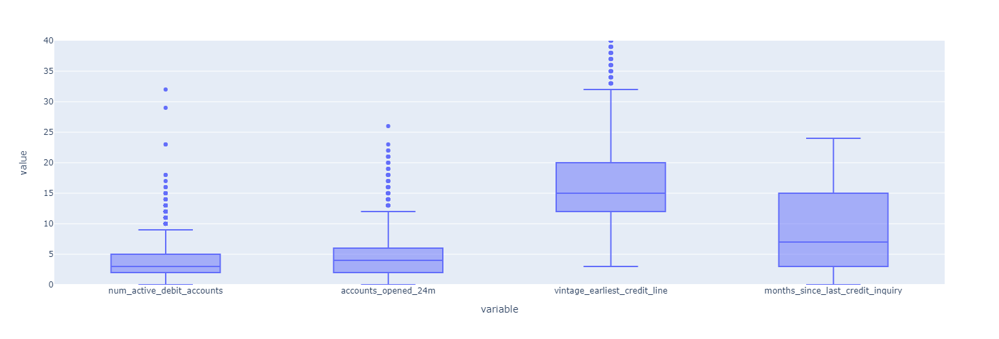

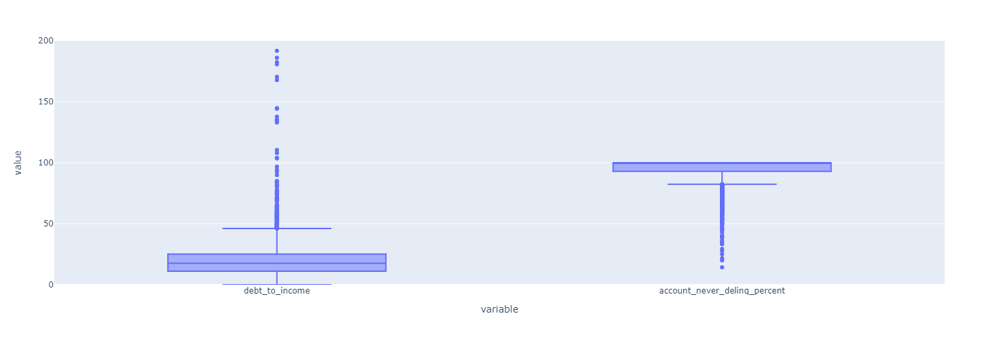

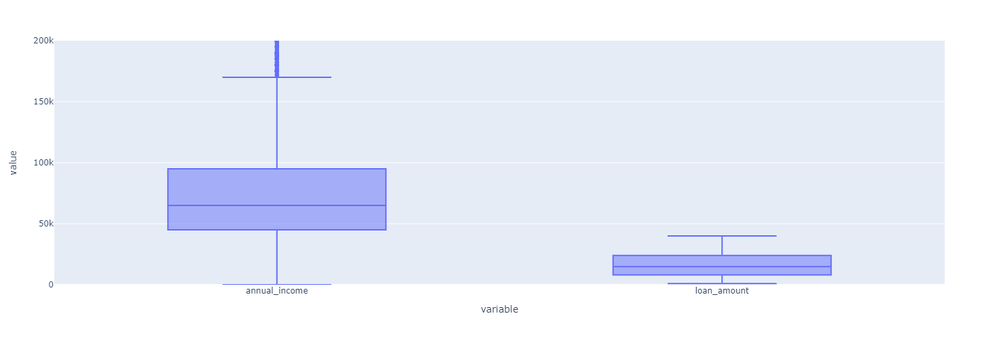

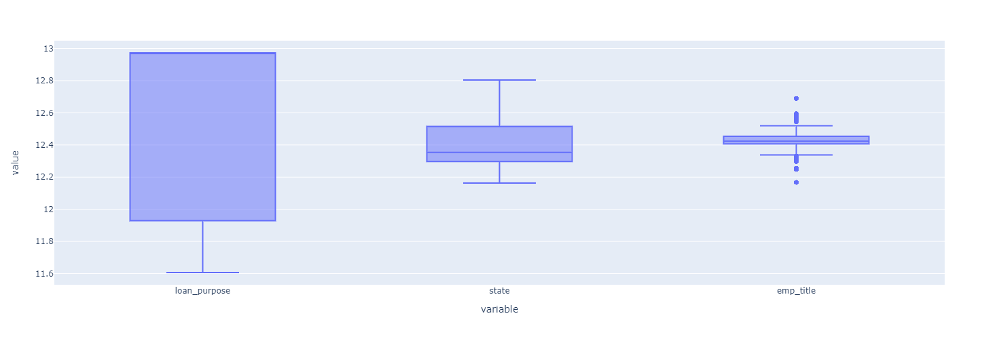

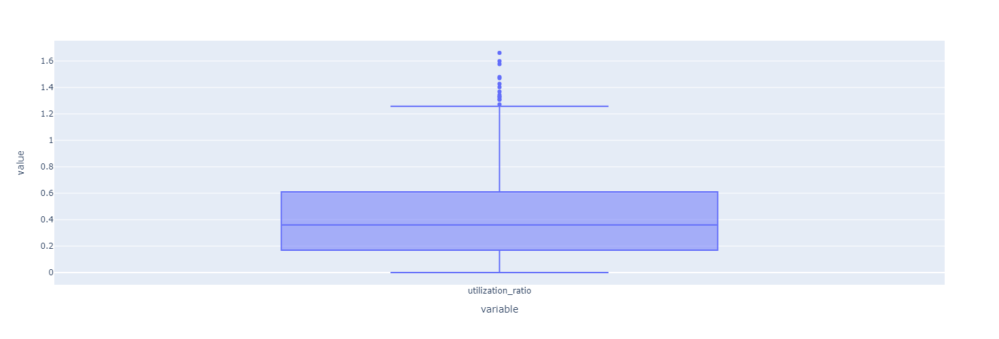

In [29]:
fig = px.box(train, height=500, y=['num_active_debit_accounts', 'accounts_opened_24m', 'vintage_earliest_credit_line', 'months_since_last_credit_inquiry'])
fig2 = px.box(train, height=500, width=1000, y=['debt_to_income', 'account_never_delinq_percent'])
fig3 = px.box(train, height=500, width=1000, y=['annual_income',  'loan_amount'])
fig4 = px.box(train, height=500, width=1000, y=['loan_purpose','state', 'emp_title' ])
fig5 = px.box(train, height=500, width=600, y=['utilization_ratio'])

fig.update_yaxes(range=[0, 40])
fig.show()

fig2.update_yaxes(range=[0, 200])
fig2.show()

fig3.update_yaxes(range=[0, 200000])
fig3.show()

fig4.show()

fig5.show()

<br><br><br>

##### We can see that many of the variables are skewed and do not follow a normal distribution. Therefore, for treating our data before running our models, we can normalize it instead of standardizing it. (Ideally this should be done on a case-to-case basis)

In [30]:
features_new = ['num_active_debit_accounts',
'account_never_delinq_percent',
'loan_purpose',
'annual_income',
'accounts_opened_24m',
'months_since_last_credit_inquiry',
'state',
'vintage_earliest_credit_line',
'debt_to_income',
'loan_amount',
'utilization_ratio',
'emp_title'
]

In [31]:
from sklearn.preprocessing import MinMaxScaler

train1 = MinMaxScaler().fit_transform(train[features_new+['interest_rate']])


<br><br><br>

##### Before we proceed with building the model, we need to check for multicollinearity. This can be checked using Variance Inflation Factor. A VIF > 5 is considered to be high and variables with high VIF need to be removed.


In [32]:
def print_vif(train1,cols):
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    X_train1 = pd.DataFrame(train1,columns=cols)
    vif = [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])]
    vif_s =pd.Series(vif, index =X_train1.columns)
    print(vif_s)

In [33]:
print_vif(train1[:,:12],features_new)

num_active_debit_accounts            3.723367
account_never_delinq_percent        22.613346
loan_purpose                         3.332340
annual_income                        2.914600
accounts_opened_24m                  3.551612
months_since_last_credit_inquiry     1.296747
state                                3.372590
vintage_earliest_credit_line         4.188374
debt_to_income                       2.929042
loan_amount                          3.770346
utilization_ratio                    3.327675
emp_title                           12.425064
dtype: float64


<br><br><br>

##### We can see that the VIF of *account_never_delinq_percent* and *emp_title* is quite high! We shall remove these variables iteratively till all VIFs come under the threshold of 5.

In [34]:
features_new.remove('account_never_delinq_percent')
train1 = np.delete(train1,1,axis=1)
print_vif(train1[:,:11],features_new)

num_active_debit_accounts           3.633913
loan_purpose                        3.231298
annual_income                       2.832511
accounts_opened_24m                 3.402479
months_since_last_credit_inquiry    1.263982
state                               3.218553
vintage_earliest_credit_line        4.095795
debt_to_income                      2.891732
loan_amount                         3.626323
utilization_ratio                   3.083839
emp_title                           8.178301
dtype: float64


In [35]:
features_new.remove('emp_title')
train1 = np.delete(train1,10,axis=1)
print_vif(train1[:,:10],features_new)

num_active_debit_accounts           3.611555
loan_purpose                        3.039953
annual_income                       2.830628
accounts_opened_24m                 3.212519
months_since_last_credit_inquiry    1.242758
state                               2.998644
vintage_earliest_credit_line        3.759728
debt_to_income                      2.850160
loan_amount                         3.580365
utilization_ratio                   2.815627
dtype: float64


<br><br>
##### Now that multicollinearity is removed, we can proceed to building the models.

<br><br><br>

### **_Model Development_**

### 1. Linear Regression
##### First model we can try is linear regression. The package Statsmodels is quite convenient as it supplies a comprehensive summary of the model metrics in order to evaluate it.

In [36]:
def run_lin_regression(y,x):
    import statsmodels.api as sm
    model = sm.OLS(y, x)
    #Statsmodels has a fit_regularized function which uses regularization,
    #but the summary function has not been implemented yet.
    #Using the normal fit function here for the sake of explainability.
    
    fit_model = model.fit()
    summary = fit_model.summary()
    print(summary)
    return fit_model

In [37]:
model = run_lin_regression(train1[:, -1], train1[:,:10])

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.706
Model:                            OLS   Adj. R-squared (uncentered):              0.706
Method:                 Least Squares   F-statistic:                              1800.
Date:                Tue, 02 Nov 2021   Prob (F-statistic):                        0.00
Time:                        04:14:01   Log-Likelihood:                          2045.8
No. Observations:                7500   AIC:                                     -4072.
Df Residuals:                    7490   BIC:                                     -4002.
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br><br>

##### The p-values of the 1st and 7th variable is high! (Threshold of 0.05 is generally accepted). Re-running after removing the variables:

In [38]:
features_new.remove('num_active_debit_accounts')
features_new.remove('vintage_earliest_credit_line')

train1 = np.delete(train1,6,axis=1)
train1 = np.delete(train1,0,axis=1)

model = run_lin_regression(train1[:, -1], train1[:,:8])

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.706
Model:                            OLS   Adj. R-squared (uncentered):              0.706
Method:                 Least Squares   F-statistic:                              2248.
Date:                Tue, 02 Nov 2021   Prob (F-statistic):                        0.00
Time:                        04:14:11   Log-Likelihood:                          2043.9
No. Observations:                7500   AIC:                                     -4072.
Df Residuals:                    7492   BIC:                                     -4016.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br>

### **_Results of Linear Regression_**
<br>

##### The model has an R Squared value of 0.706 which is good, but definitely requires fine-tuning. The p-values are very small indicating that all the variables are significant and contribute to the model.
<br>

##### Now running the model on the test data:

In [39]:
test1 = MinMaxScaler().fit_transform(test[features_new+['interest_rate']])

train_pred = model.predict(train1[:,:8])
test_pred = model.predict(test1[:,:8])

from statsmodels.tools.eval_measures import mse

print("MSE of training data:")
print(mse(train1[:,-1],train_pred))
print("MSE of test data:")
print(mse(test1[:,-1],test_pred))


MSE of training data:
0.033948702571833675
MSE of test data:
0.03368352792118426


<br><br>

##### We can see that the Mean Squared Error for the training and test data are similar indicating that the model is able to generalize well for new data and there is not much overfitting happening. (Out of Time Validation might be better here since it is likely that the train and test data have very similar distributions).
<br><br>

### 2. Artificial Neural Network

##### Now, let us try another model using Neural Networks. Neural Networks will help capture non-linearity in the data if any.

In [40]:
features_nn = ['num_active_debit_accounts',
'loan_purpose',
'annual_income',
'accounts_opened_24m',
'months_since_last_credit_inquiry',
'state',
'vintage_earliest_credit_line',
'debt_to_income',
'loan_amount',
'utilization_ratio'
]

train1 = MinMaxScaler().fit_transform(train[features_nn+['interest_rate']])
test1 = MinMaxScaler().fit_transform(test[features_nn+['interest_rate']])

##### To keep the model simple and avoid overfitting, we will use a single hidden layer for the neural network architecture. Increasing the complexity of this model beyond this does not yield significantly superior results.
<br>

##### After experimenting with various hyperparameters and optimizers, the following neural network acheives the best results.

Epoch 1/50
188/188 [==============================] - 1s 1ms/step - loss: 0.1447 - mse: 0.1447 - mae: 0.3209 - val_loss: 0.1240 - val_mse: 0.1240 - val_mae: 0.2856
Epoch 2/50
188/188 [==============================] - 0s 825us/step - loss: 0.0904 - mse: 0.0904 - mae: 0.2351 - val_loss: 0.0748 - val_mse: 0.0748 - val_mae: 0.2074
Epoch 3/50
188/188 [==============================] - 0s 1ms/step - loss: 0.0558 - mse: 0.0558 - mae: 0.1797 - val_loss: 0.0536 - val_mse: 0.0536 - val_mae: 0.1778
Epoch 4/50
188/188 [==============================] - 0s 852us/step - loss: 0.0451 - mse: 0.0451 - mae: 0.1651 - val_loss: 0.0477 - val_mse: 0.0477 - val_mae: 0.1705
Epoch 5/50
188/188 [==============================] - 0s 770us/step - loss: 0.0416 - mse: 0.0416 - mae: 0.1602 - val_loss: 0.0451 - val_mse: 0.0451 - val_mae: 0.1668
Epoch 6/50
188/188 [==============================] - 0s 760us/step - loss: 0.0398 - mse: 0.0398 - mae: 0.1569 - val_loss: 0.0435 - val_mse: 0.0435 - val_mae: 0.1641
Epoch 7/

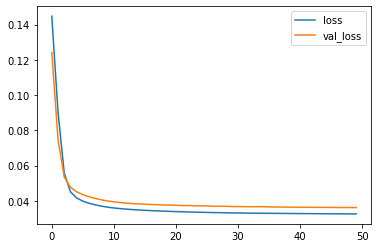

In [41]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

def run_ann(x,y):
    
    model = Sequential([
        Dense(10, activation=tf.nn.relu, input_shape=(10,)),
        Dense(10, activation=tf.nn.relu),
        Dense(1)
    ])
    
    opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
    model.compile(loss='mean_squared_error',optimizer=opt, metrics=['mse', 'mae'])
    fit_model = model.fit(x,y,epochs=50, validation_split=0.2)
    
    history_df = pd.DataFrame(fit_model.history)
    
    #Plotting the training and validation loss across epochs
    plt.plot(history_df['loss'], label='loss')
    plt.plot(history_df['val_loss'], label='val_loss')

    plt.legend()
    plt.show()
    
    return model
    
model = run_ann(train1[:,:10], train1[:, -1])

<br><br><br>

### **_Results of Artificial Neural Network_**

In [42]:
model.evaluate(train1[:,:10], train1[:, -1])
model.evaluate(test1[:,:10], test1[:, -1])

79/79 [==============================] - 0s 437us/step - loss: 0.0330 - mse: 0.0330 - mae: 0.1381


[0.033040814101696014, 0.033040814101696014, 0.13808883726596832]

<br>

##### In this case too, the test MSE is similar to the training MSE, so the model generalizes well.
<br><br>
##### The performance of the Neural Network is quite similar to that of Linear Regression indicating that there is not much non-linearity in the data.

<br><br>

## _<u>Propose enhancements to the model, what would you do if you had more time?</u>_

### 1. Feature Engineering
* Most of the features used in these models we picked up directly from the existing dataset with minimal processing.
* Creation of new features and gauging their predictive power would be an important step to improve model performance.
* A deep-dive into each of the model variables and their intuition is necessary.
* Creation of Interaction Features - Combining the predictive power of features when one fails in certain situations (Eg. High amount of Missing Values) can help bring out some overlooked variables.
* PCA is a good way to access latent features invisible to the human eye.
* Verified and Unverified annual income was treated the same. A new variable that captures the differences might be better.

### 2. Business Intuition
* A lot of this analysis was done purely from the dataset without knowledge of the story behind the data.
* Gaining insight into the functioning Lending Club ecosystem might help make more intuitive choices behind choosing certain features.

### 3. Hyperparameter Tuning
* The models created here were experimented with manually and minimally, resulting in average performance.
* Spending some time optimizing the hyperparameters will go a long way into improving model performance.
* One way to pick the optimum set of hyperparameters would be to plot the bias-variance curve across different choices of hyperparameters and choosing the optimum set.

### 4. Rigorous performance evaluation
* While the metrics used to evaluate performance are fairly robust, more effort needs to be spent in comparing different models using a variety of metrics.
* Possible checks include evaluating predictive power of variables using Wald Chi Square, and running goodness of fit tests like K-S Test.

### 5. Model Development Techniques
* Other techniques can be used to optimize model performance include regularization, cross-validation etc.